# Population Splitting for IBD Exomes v36 - 09/05/19
## Author: Guhan Venkataraman

### Part 1: 1kG Superpopulation Prediction

The below cell takes care of the necessary imports.

### Note: hailctl dataproc start guhancluster --vep GRCh38 --zone us-west1-b --num-workers 148 --worker-machine-type n1-highmem-16 --master-machine-type n1-highmem-32 --worker-boot-disk-size 100

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
import os

The next cell reads in the files containing the lists of Thousand Genomes and CCDG Genomes samples.

In [2]:
with open('../sample_lists/1kg_samples.tsv') as f:
    kg_samples = f.readlines()
kg_samples = [x.strip() for x in kg_samples]

with open('../sample_lists/ccdg_samples.tsv') as f:
    ccdg_samples = f.readlines()
ccdg_samples = [x.strip() for x in ccdg_samples]

Now, we read in the PC projections of 1kG loadings onto all samples (generated via `pca.py` and the Hail package, in this same directory), parsing the raw file (which is messily formatted) into a human readable format and writing to file.

In [3]:
All = pd.read_table('1kg_pca_projections_all_samples.tsv')
All['scores'] = All['scores'].str.replace('[', '').str.replace(']', '')
cols = ['PC'+ str(i) for i in range(10)]
All[cols] = All['scores'].str.split(',', expand=True).astype(np.float64)
cols = ['s'] + cols
All = All[cols]
All.to_csv('1kg_pca_projections_all_samples_clean.tsv', sep='\t', index=False)

In order to visualize the projections by dataset, we create a "dataset" column via the sample manifests we loaded up previously.

v36 samples: 55701
CCDG samples: 7911
1kG samples: 2504


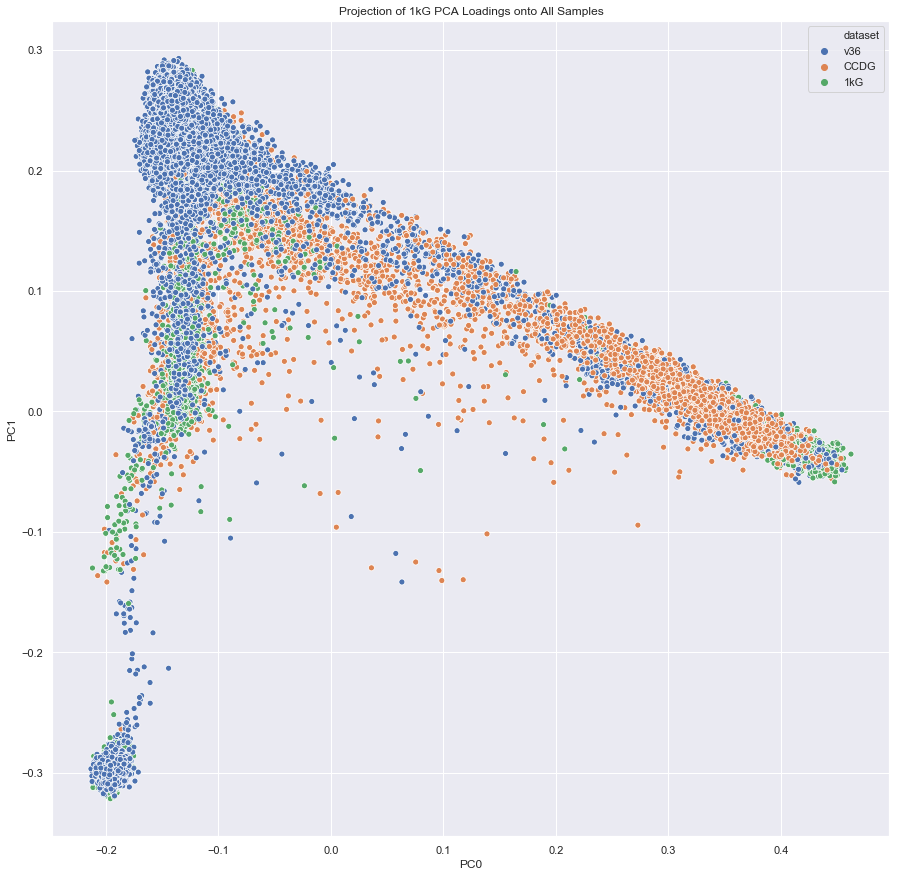

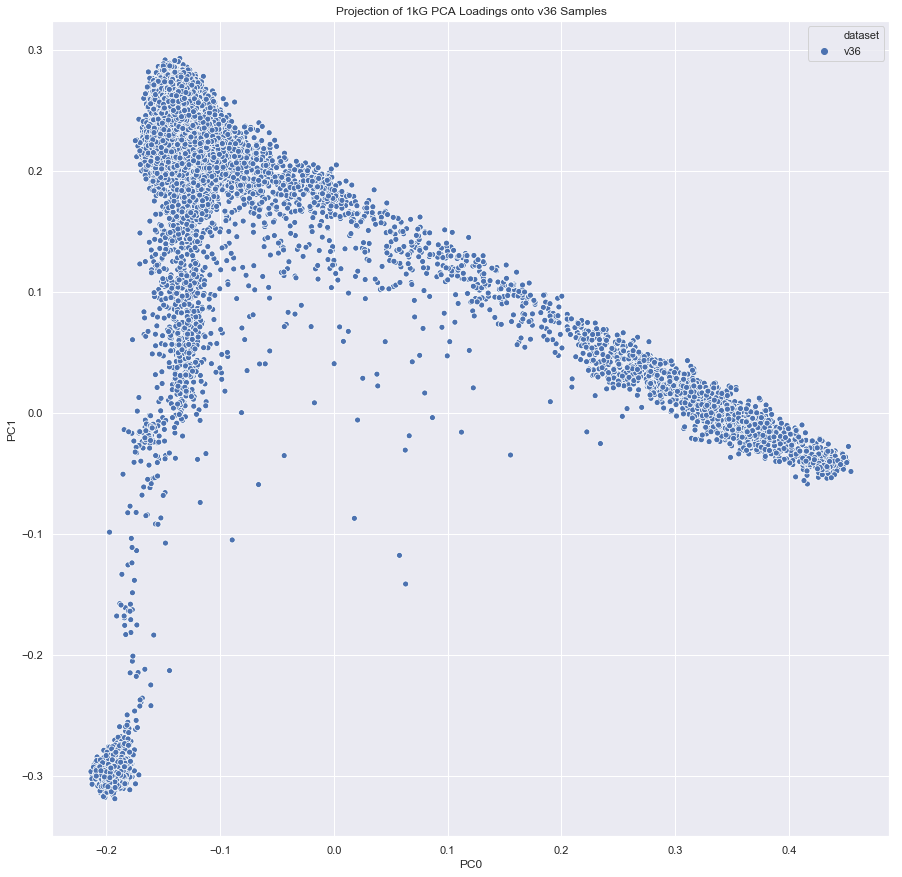

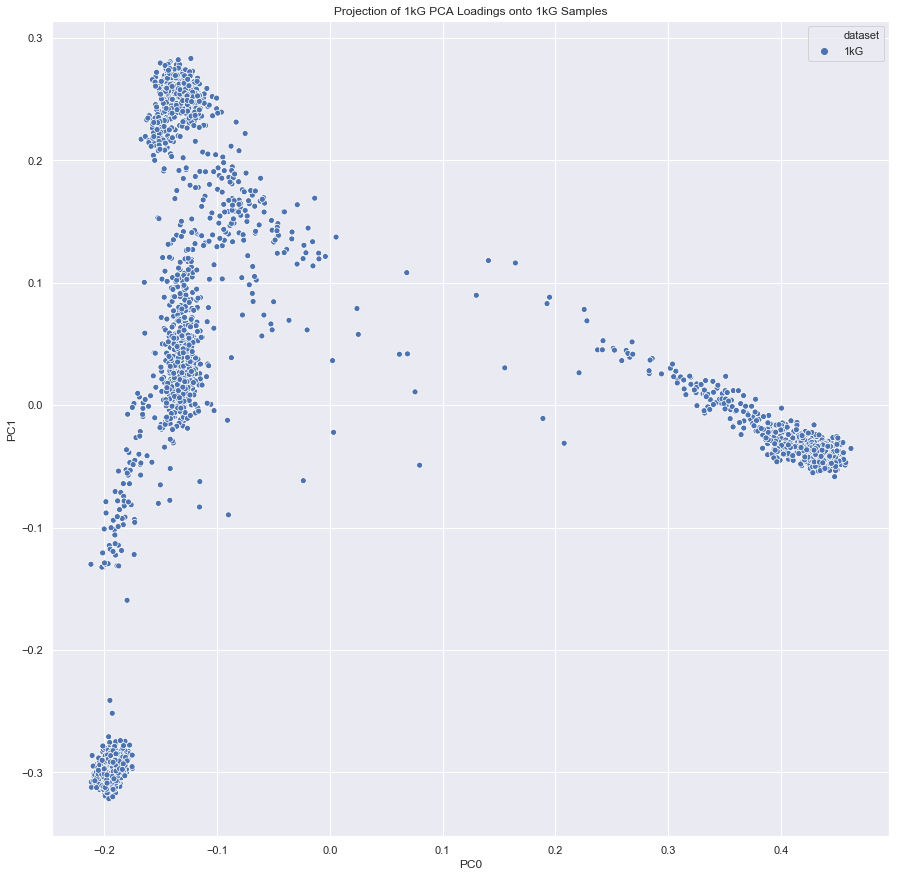

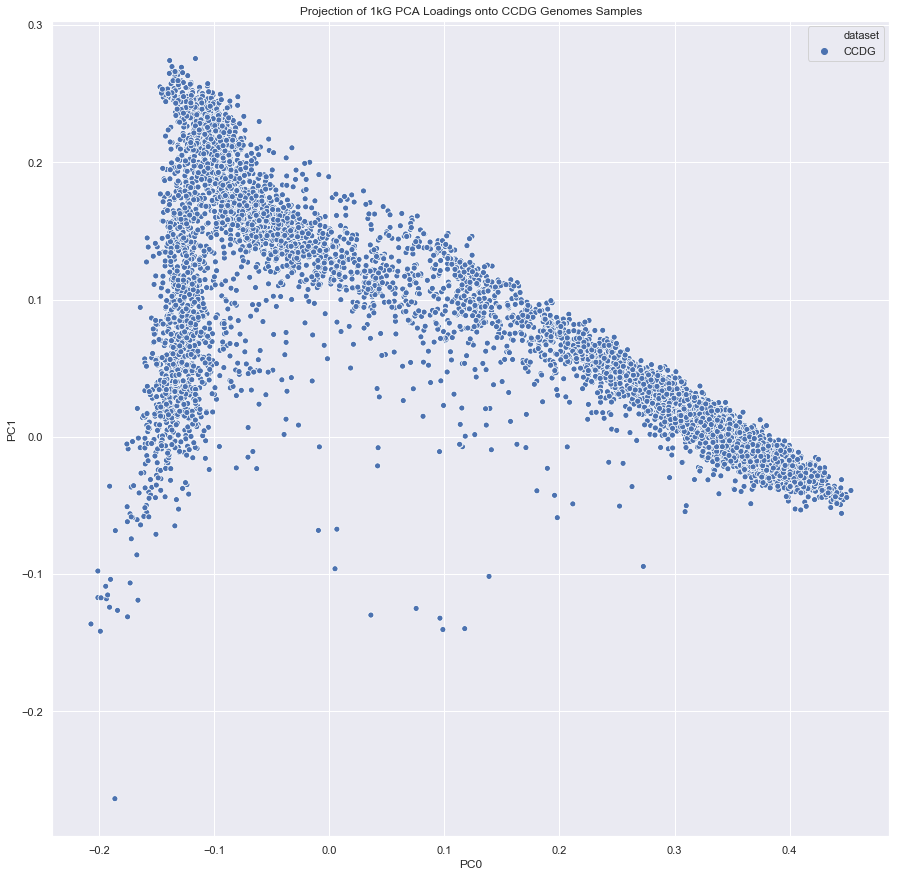

In [4]:
All['dataset'] = 'NA'
for i, row in All.iterrows():
    if (All.at[i, 's'] in kg_samples):
        All.at[i, 'dataset'] = '1kG'
    elif (All.at[i, 's'] in ccdg_samples):
        All.at[i, 'dataset'] = 'CCDG'
    else:
        All.at[i, 'dataset'] = 'v36'
CCDG = All[All['dataset'] == 'CCDG']
KG = All[All['dataset'] == '1kG']
v36 = All[All['dataset'] == 'v36']
print("v36 samples: " + str(len(v36)))
print("CCDG samples: " + str(len(CCDG)))
print("1kG samples: " + str(len(KG)))
# Graphs of each dataset, combined and separate
for dataset, name in zip([All, v36, KG, CCDG], ['All', 'v36', '1kG', 'CCDG Genomes']):
    plt.figure(figsize=(15,15))
    sns.set()
    sns.scatterplot('PC0', 'PC1', hue='dataset', label='', data=dataset).set_title('Projection of 1kG PCA Loadings onto ' + name + ' Samples')

The next step in this process is to do an iterative RF classification on the samples that do not yet have population labels.

The first RF is trained on 1kG data and labels - African-American (AFR), "American"/Hispanic/Native American (AMR), European (EUR), East Asian (EAS), and South Asian (SAS) - collectively referred to as "superpopulation labels". The RF predicts the superpopulation label of every sample in the dataset.

The second RF is trained to re-classify those classified as EUR in the previous step as members of Ashkenazi Jew (AJ), Finnish (FIN), Lithuanian (LIT), or Non-Finnish European (NFE) populations. Samples already labeled as such are the training data, and those EUR samples that don't yet have a sub-population classification will utilize predictions from this classifier.

In the end, we will always use the most accurate label possible. That is, if an AFR sample from the CCDG Genomes is explicitly already classified as such, regardless of whether or not the first or second RFs misclassify the sample, we will use the correct label.

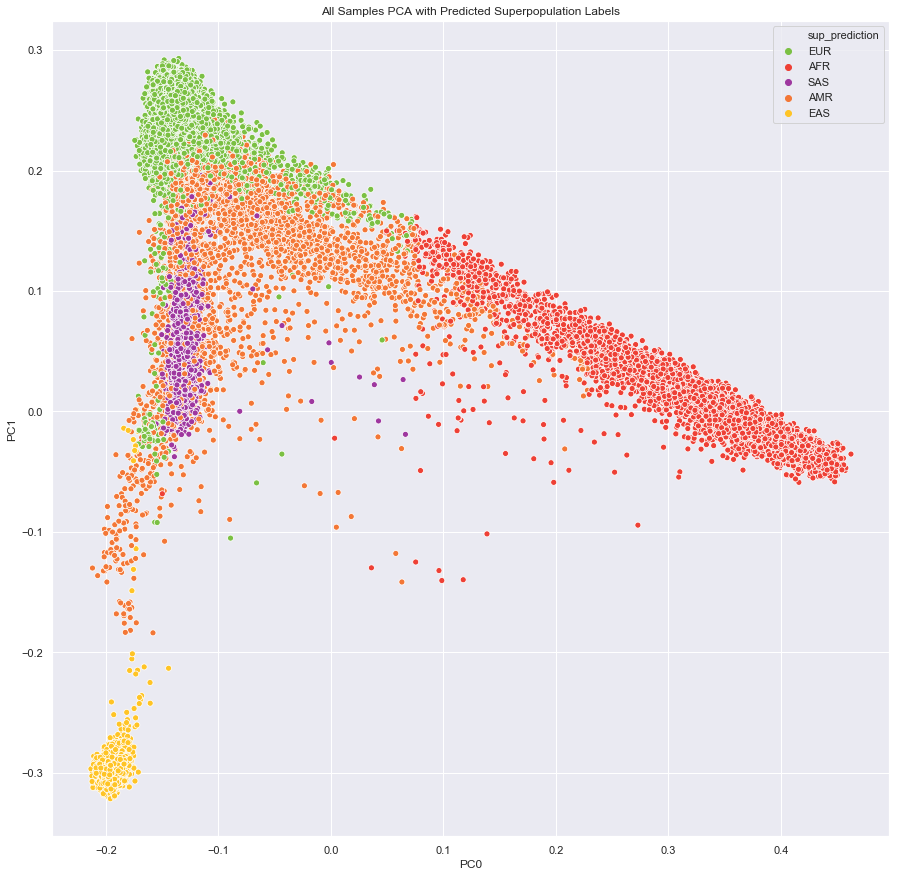

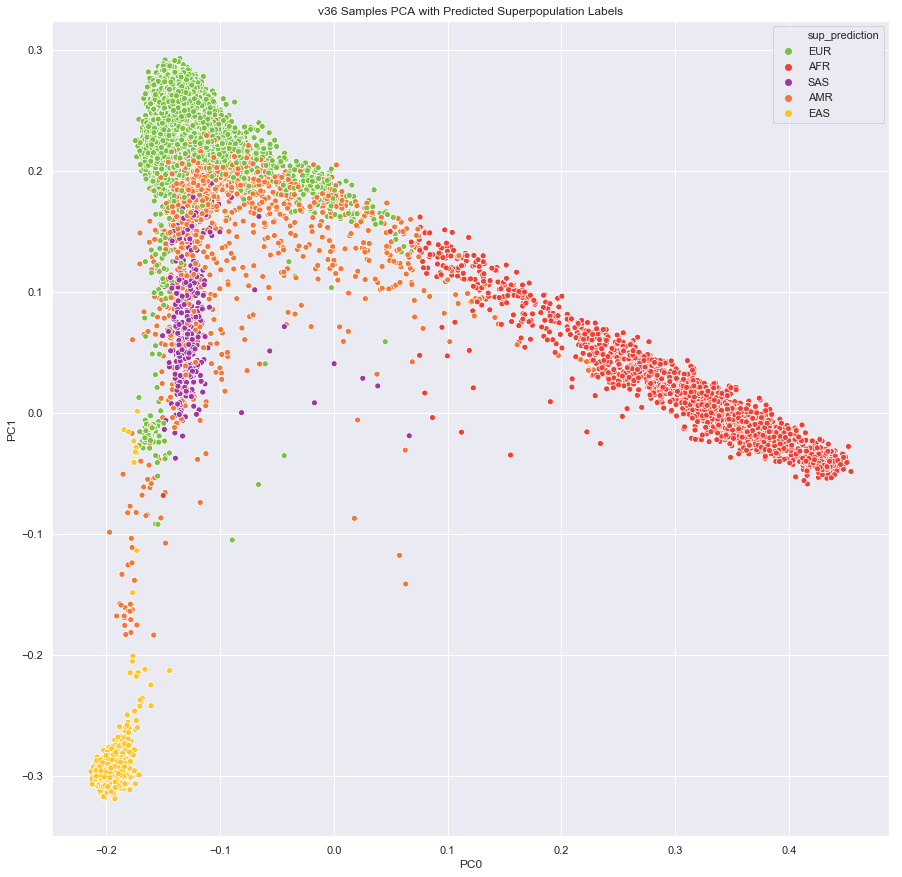

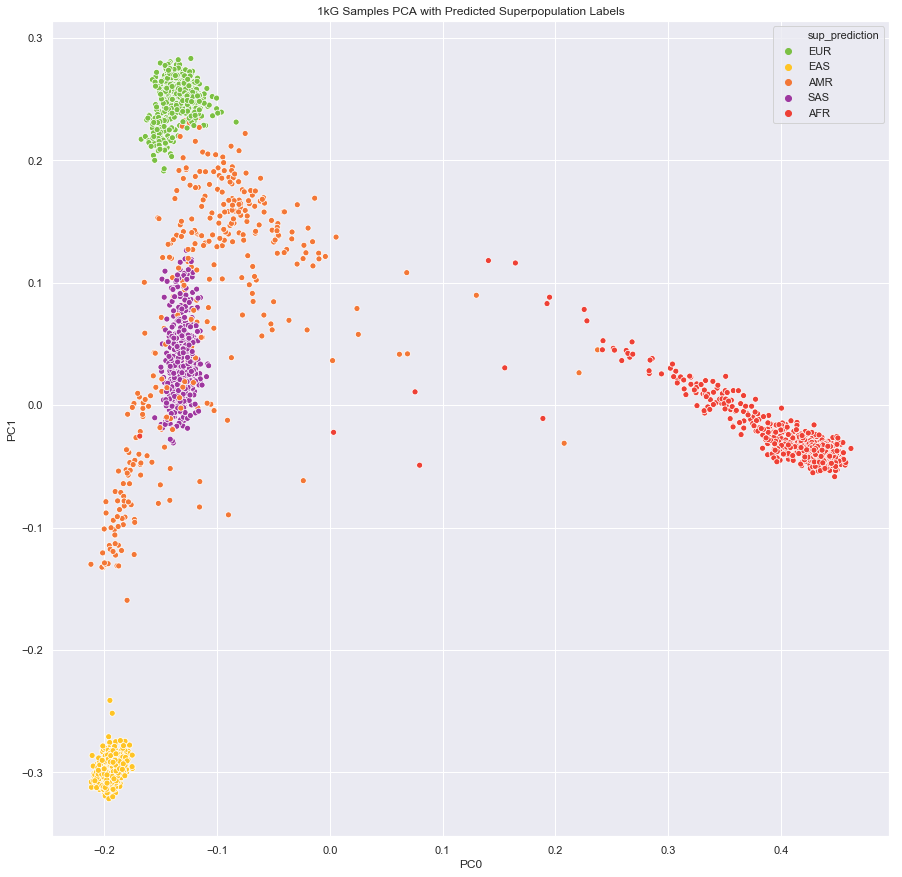

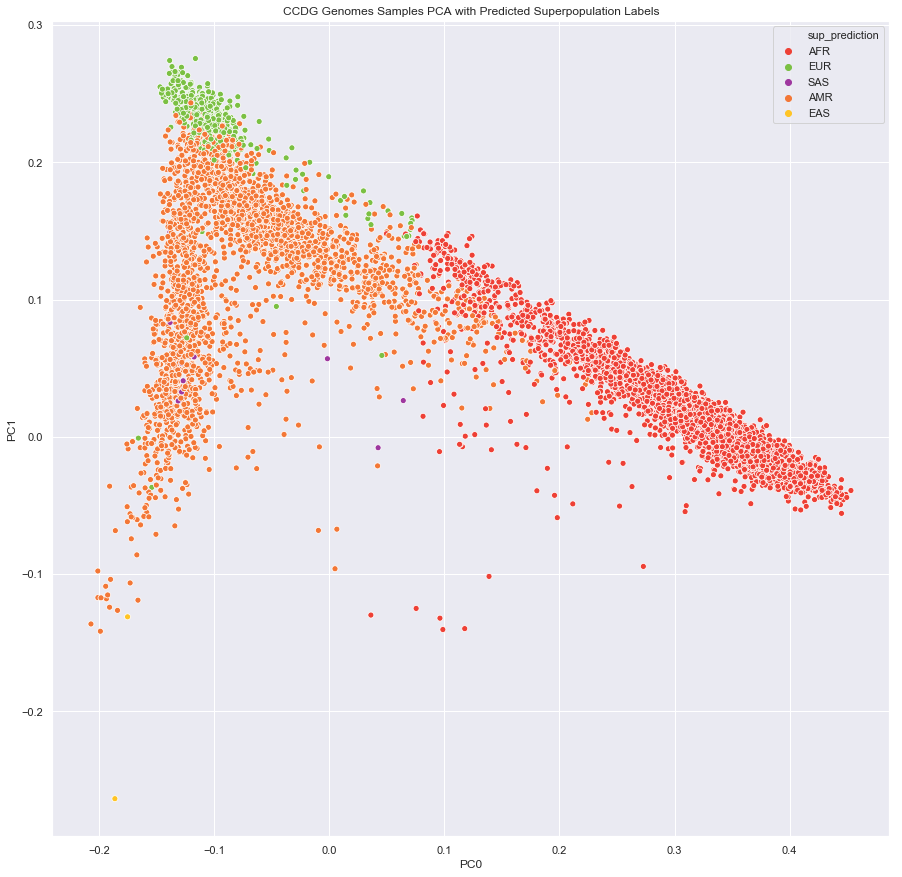

In [5]:
# Gathering train data
pc_data = pd.read_table('1kg_pca_projections_all_samples_clean.tsv')
kg = pd.read_table('1kgpop.tsv')
#Filter for those samples in our dataset
kg = kg.merge(pc_data, left_on='Sample name', right_on='s')

# Initializing and fitting the classifier
sup_rfc = RandomForestClassifier()
X_train = kg.columns[3:]
y_train = kg.columns[1]
sup_rfc.fit(kg[X_train], kg[y_train])
sup_pops = ['AFR', 'AMR', 'EAS', 'EUR', 'SAS']
pc_data['sup_prediction'] = sup_rfc.predict(pc_data[X_train])
for i, row in pc_data.iterrows():
    if (pc_data.at[i, 's'] in kg_samples):
        pc_data.at[i, 'dataset'] = '1kG'
    elif (pc_data.at[i, 's'] in ccdg_samples):
        pc_data.at[i, 'dataset'] = 'CCDG'
    else:
        pc_data.at[i, 'dataset'] = 'v36'
CCDG = pc_data[pc_data['dataset'] == 'CCDG']
KG = pc_data[pc_data['dataset'] == '1kG']
v36 = pc_data[pc_data['dataset'] == 'v36']

# Graphs of each dataset, combined and separate, with predicted superpopulation as hue
for dataset, name in zip([pc_data, v36, KG, CCDG], ['All', 'v36', '1kG', 'CCDG Genomes']):
    plt.figure(figsize=(15,15))
    sns.set()
    sns.scatterplot('PC0', 'PC1', hue='sup_prediction', data=dataset, palette=dict(AFR="#ee4035", AMR="#f37736", EAS="#ffc425", EUR="#7bc043", NA="#0392cf", SAS="#9e379f")).set_title(name + ' Samples PCA with Predicted Superpopulation Labels')

### Part 2: Sub-population Prediction

Now that we have superpopulation codes for each sample, the next step in the procedure is to retrieve sample-level sub-population annotations and diagnoses. We merge these data with our existing principal component data.

In [6]:
# Read in table with sub-populations and diagnoses
pops = pd.read_table('v36+ccdg_pop+diagnosis.tsv').drop_duplicates()
pops = pops.replace('AFRICAN AMERICAN', 'AFR')

pc_data = pc_data.merge(pops, left_on=['s'], right_on='SAMPLE_ID').drop('SAMPLE_ID',axis=1)
#NO POPULATION MAPPING for these
pc_data = pc_data[~(pc_data['COHORT'].isin(['ALM', 'NEC', 'FARMER']))]

It is important to note that the Random Forest classifier is just that - there is a certain degree of randomness to superpopulation label assignment for those non-obvious fringe cases. Thus, we have frozen the list of train and test samples below.

In [7]:
# For generating list of test and train samples
eur_pops = ['AJ', 'FIN', 'NFE', 'LIT']
unfinalized_pops = ['CONTROL', 'US- NIDDK', 'US- Other Cohorts', 'US- MGH PRISM']
if not os.path.exists('pc_data_sup_pop_freeze.tsv'):
    print("Writing...")
    pc_data.to_csv('pc_data_sup_pop_freeze.tsv', sep='\t', index=False)

In [10]:
pc_data = pd.read_table('pc_data_sup_pop_freeze.tsv')
eur_train_data = list(pc_data[pc_data['RACE/ETHNICITY'].isin(eur_pops)]['s'])
eur_test_data = list(pc_data[(pc_data['sup_prediction'] == 'EUR') & (pc_data['RACE/ETHNICITY'].isin(unfinalized_pops))]['s'])
eur_samples_to_pca = set(eur_train_data).union(set(eur_test_data))
if not os.path.exists('eur_samples_to_pca.tsv'):
    with open('eur_samples_to_pca.tsv', 'w') as f:
        print("Writing...")
        f.write("s\n")
        for item in list(eur_samples_to_pca):
            f.write("%s\n" % item)

Writing...


Now that we have a freeze of train and test samples for the European classifier, the next step is to run PCA on these samples (`eur_pca.py`). This should generate a file called `eur_40_pca_scores.tsv.bgz` in the Google Cloud bucket, that can be copied over, renamed as `eur_40_pca_scores.tsv.gz`, and `gunzip`ed. We clean the file in the following cell.

In [53]:
def clean_eur_pc_data(filename, num_pcs, prefix):
    eur_pc_data = pd.read_table(filename)
    eur_pc_data['scores'] = eur_pc_data['scores'].str.replace('[', '').str.replace(']', '')
    eur_cols = [prefix + str(i) for i in range(num_pcs)]
    eur_pc_data[eur_cols] = eur_pc_data['scores'].str.split(',', expand=True).astype(np.float64)
    eur_cols = ['s'] + eur_cols
    eur_pc_data = eur_pc_data[eur_cols]
    eur_pc_data.to_csv(filename[:-4] + '_clean.tsv', sep='\t', index=False)
    return eur_pc_data

In [16]:
eur_pc_data = clean_eur_pc_data('eur_40_pca_scores.tsv', 40, 'EUR_PC')
eur_pc_data = eur_pc_data.merge(pops, left_on=['s'], right_on='SAMPLE_ID').drop('SAMPLE_ID',axis=1)

Below is the logic that assigns the final label (`sub_prediction`) as the best possible label for those samples that are already classified.

In [17]:
finalized_pops = ['AFR', 'AJ', 'EAS', 'FIN', 'HISPANIC', 'NFE', 'PUERTO RICAN', 'LIT']
for i, row in pc_data.iterrows():
    if (pc_data.at[i, 'RACE/ETHNICITY'] in finalized_pops):
        pc_data.at[i, 'sub_prediction'] = pc_data.at[i, 'RACE/ETHNICITY']
    else:  
        pc_data.at[i, 'sub_prediction'] = pc_data.at[i, 'sup_prediction']

We merge the EUR PCs with the original PCs and annotations.

In [19]:
eur_train_pc_data = eur_pc_data[eur_pc_data['s'].isin(eur_train_data)].merge(pc_data)
eur_test_pc_data = eur_pc_data[eur_pc_data['s'].isin(eur_test_data)].merge(pc_data)

We now train the second classifier and predict to generate labels for all non-classified EUR samples.

In [20]:
eur_rfc = RandomForestClassifier()
X_train = eur_train_pc_data.columns[1:41]
y_train = eur_train_pc_data.columns[-1:]
eur_rfc.fit(eur_train_pc_data[X_train], eur_train_pc_data[y_train])
eur_test_pc_data['eur_prediction'] = eur_rfc.predict(eur_test_pc_data[X_train])
eur_train_pc_data['eur_prediction'] = np.nan

eur_pc_data = pd.concat([eur_train_pc_data, eur_test_pc_data])
pc_data = eur_pc_data.merge(pc_data, how='outer')
for i, row in pc_data.iterrows():
    if pc_data.at[i, 's'] in eur_test_data:
        pc_data.at[i, 'sub_prediction'] = pc_data.at[i, 'eur_prediction']

/Users/guhan/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


The predictions can be visualized below.

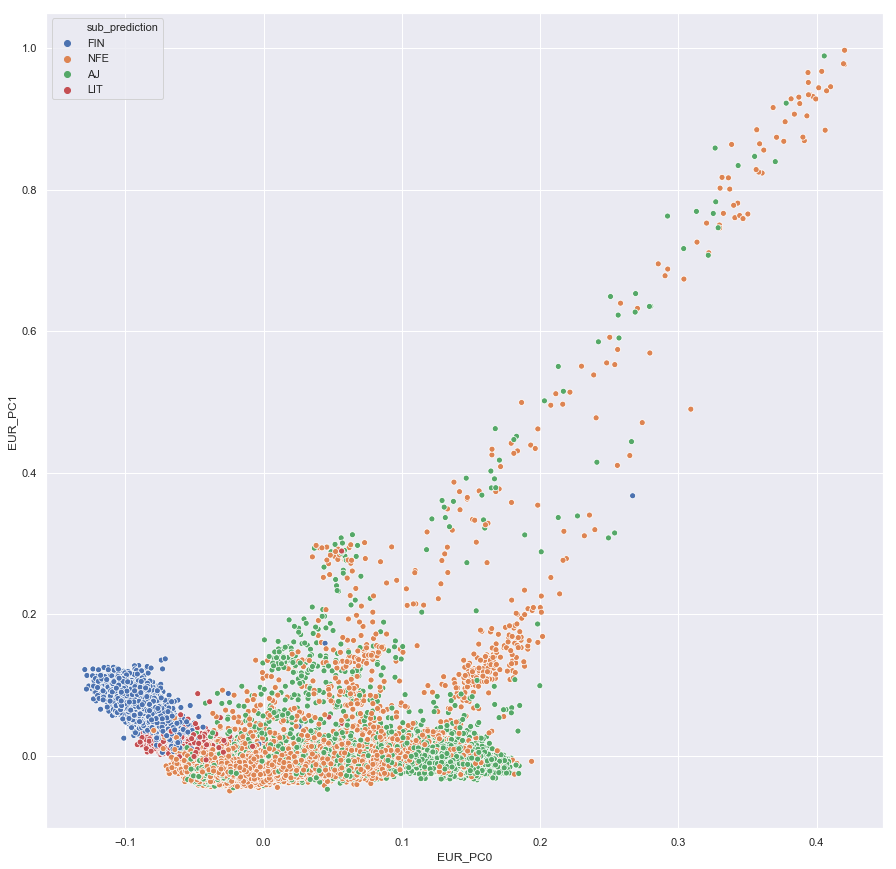

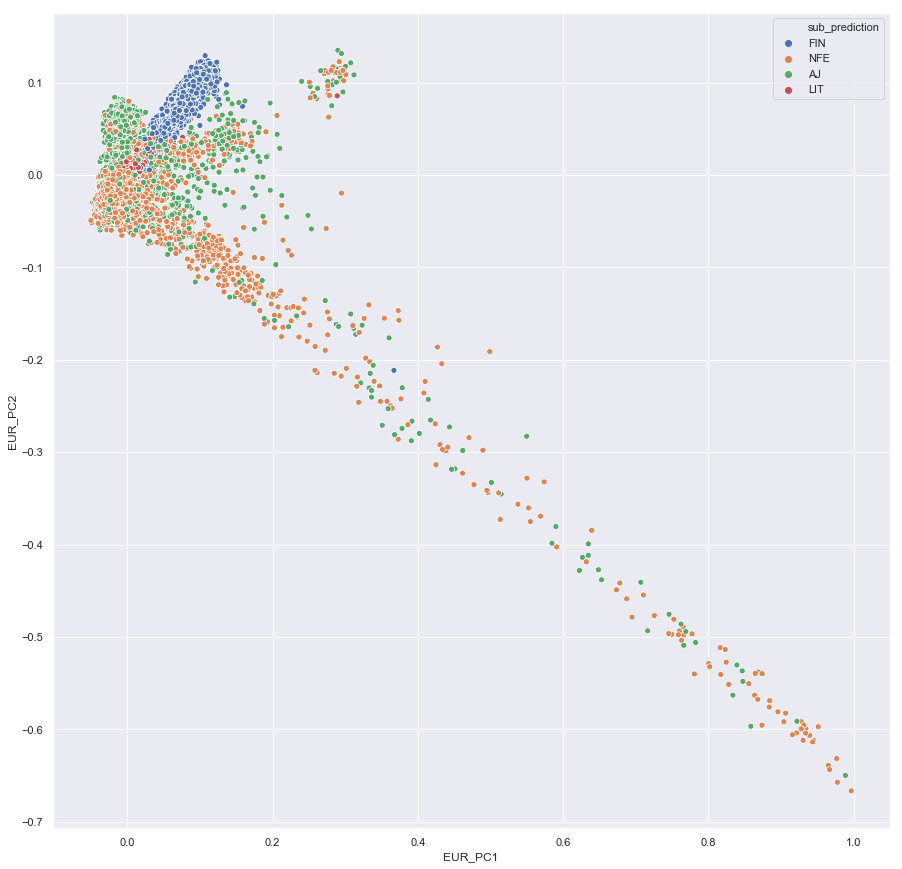

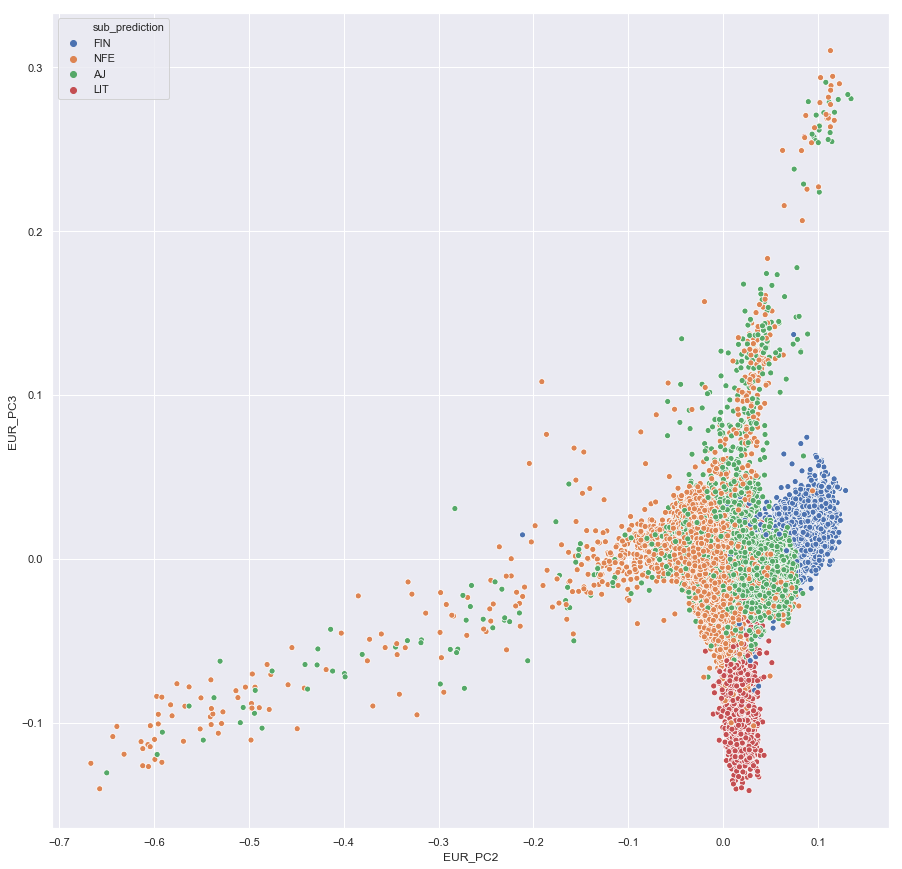

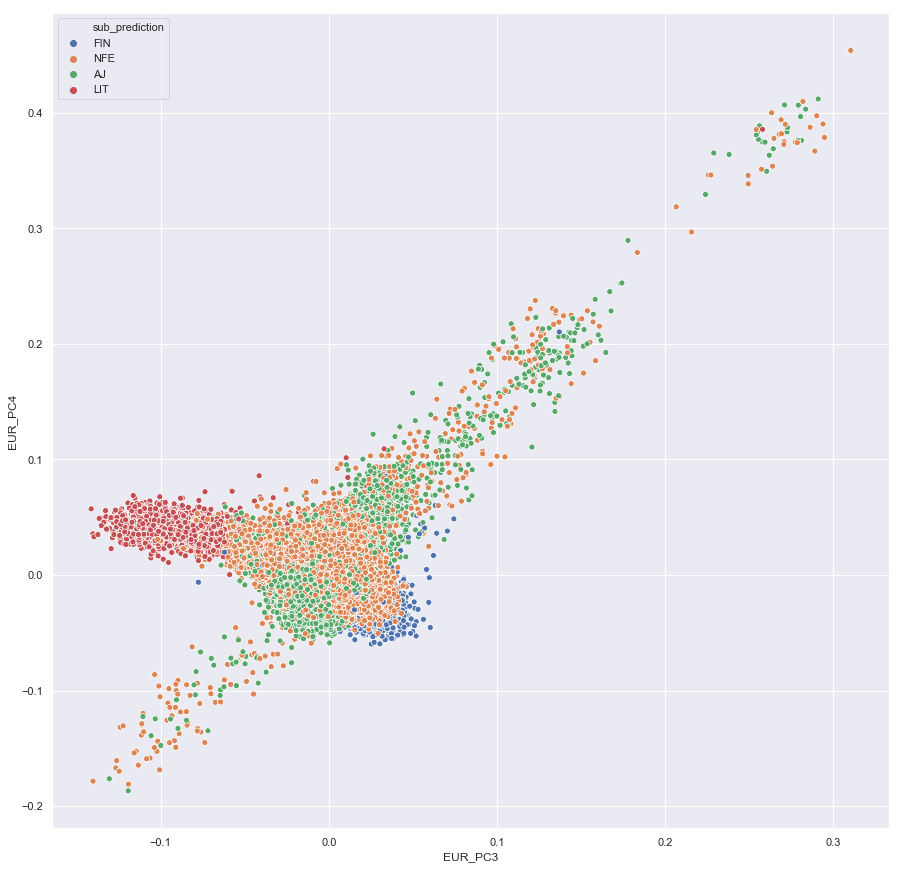

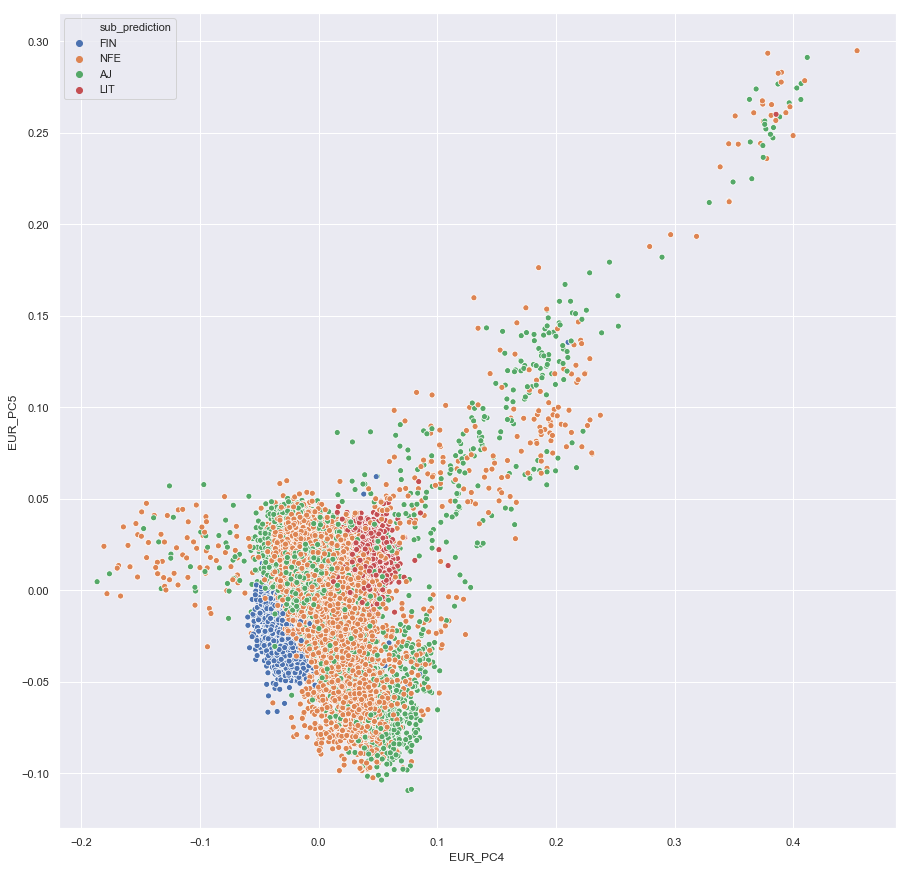

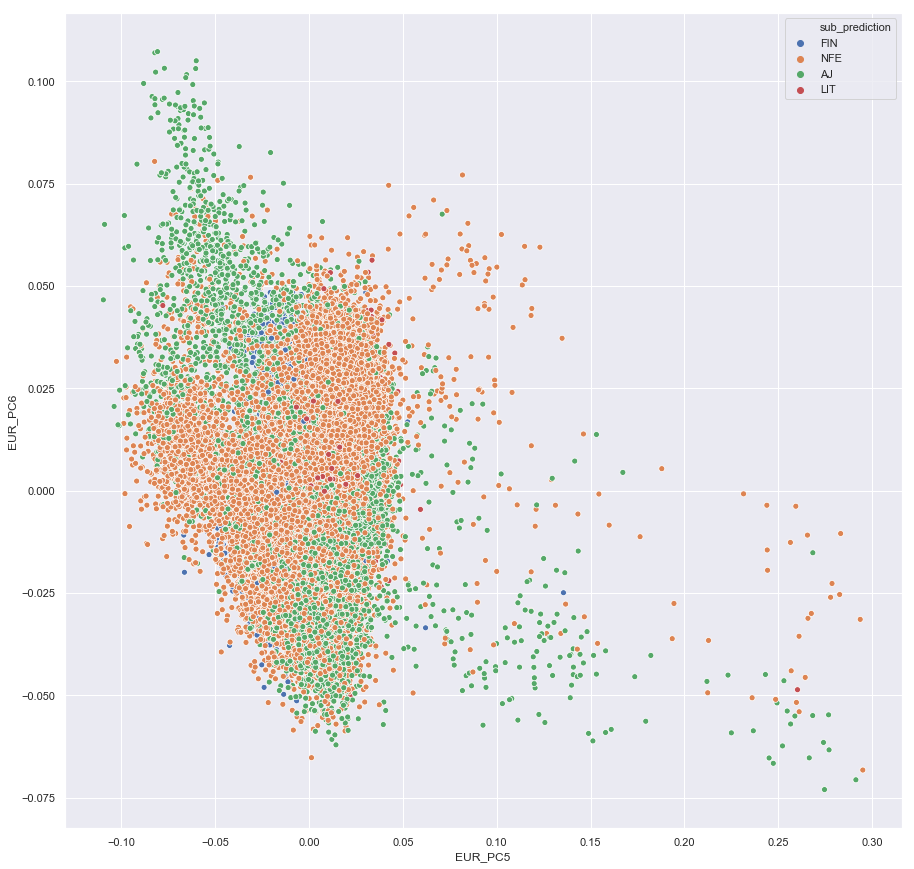

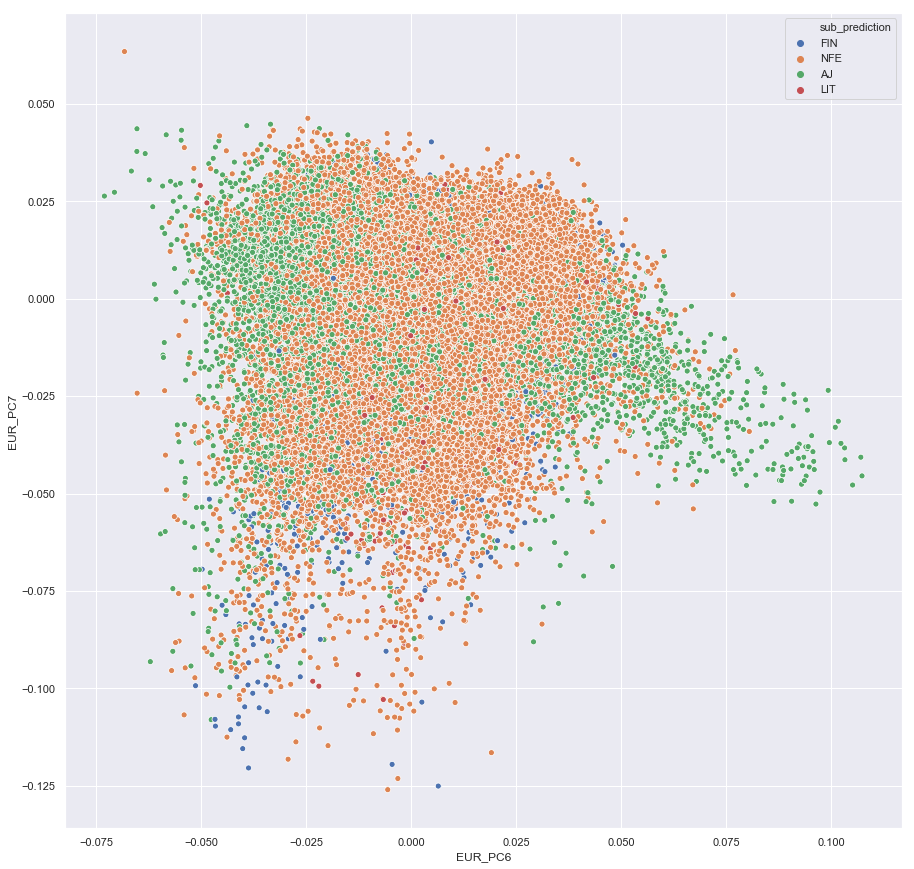

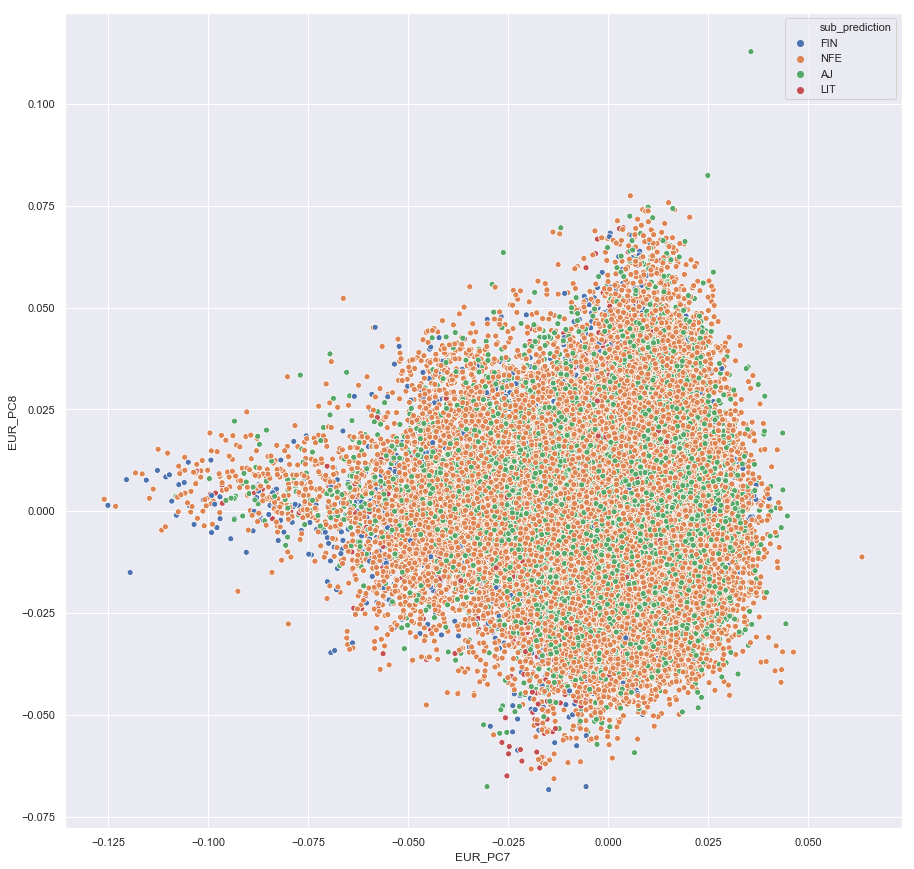

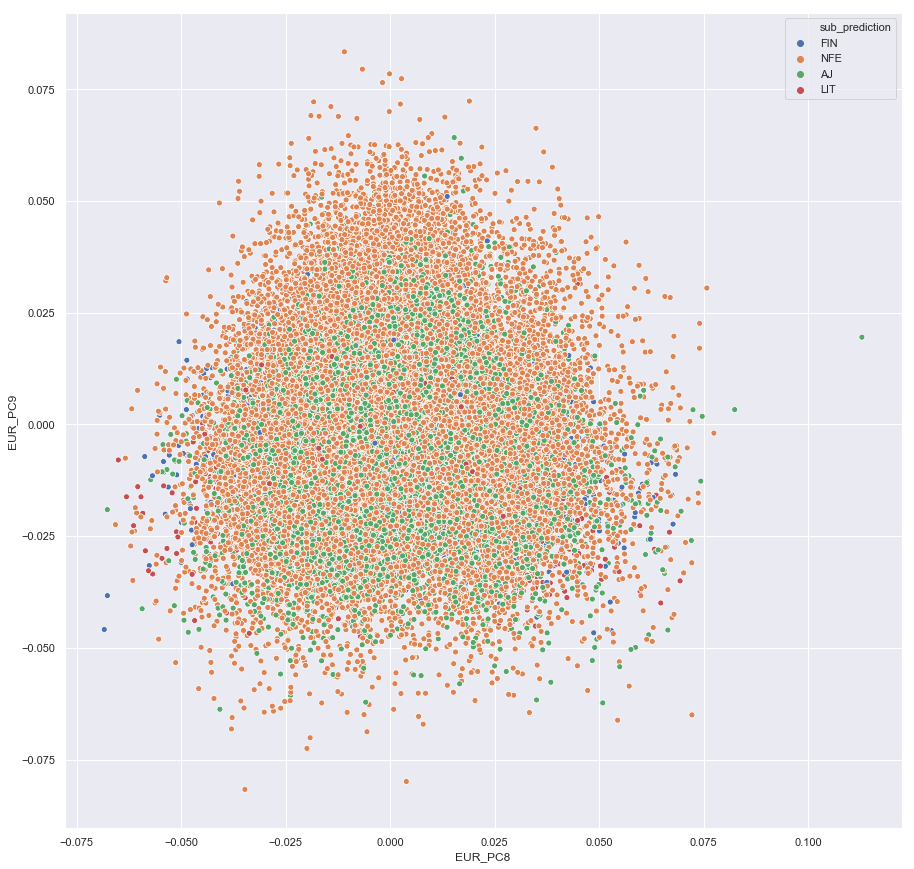

In [21]:
eur_cols = ['EUR_PC' + str(i) for i in range(10)]
for i in range(9):
    plt.figure(figsize=(15,15))
    sns.set()
    sns.scatterplot(eur_cols[i], eur_cols[i+1], hue='sub_prediction', data=pc_data[pc_data['s'].isin(list(eur_pc_data['s']))])#, #palette=dict(AFR="#ee4035", AMR="#f37736", EAS="#ffc425", EUR="#7bc043", NA="#0392cf", SAS="#9e379f")).set_title(name + ' Samples PCA with Predicted Superpopulation Labels')

### Part 3: Redoing PCA after Removing Finns and Lithuanians

These populations are distinct enough from AJs and NFEs that they will stand alone. We freeze Finnish and Lithuanian populations, and continue to compute PCs for those remaining. 

In [32]:
if not os.path.exists('pc_data_fin_lit_freeze.tsv'):
    print("Writing...")
    pc_data.to_csv('pc_data_fin_lit_freeze.tsv', sep='\t', index=False)

Writing...


In [40]:
pc_data = pd.read_table('pc_data_fin_lit_freeze.tsv')
aj_nfe_samples_to_pca = list(pc_data[(pc_data['sub_prediction'] == 'AJ') | (pc_data['sub_prediction'] == 'NFE')]['s'])
if not os.path.exists('aj_nfe_samples_to_pca.tsv'):
    with open('aj_nfe_samples_to_pca.tsv', 'w') as f:
        print("Writing...")
        f.write("s\n")
        for item in list(aj_nfe_samples_to_pca):
            f.write("%s\n" % item)

/Users/guhan/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (57) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


We now copy this sample list to the Google Cloud and run `aj_nfe_pca.py`, which excludes Finns and Lithuanians and runs PCA for only the rest.

In [54]:
# Retrain new model
aj_nfe_pc_data = clean_eur_pc_data('aj_nfe_40_pca_scores.tsv', 40, 'AJNFE_PC')
aj_nfe_train_pc_data = aj_nfe_pc_data[aj_nfe_pc_data['s'].isin(eur_train_data)].merge(pc_data)
aj_nfe_test_pc_data = aj_nfe_pc_data[aj_nfe_pc_data['s'].isin(eur_test_data)].merge(pc_data)

# eur_rfc_v2 = RandomForestClassifier()
# eur_rfc_v2.fit(eur_train_pc_data_v2[X_train], eur_train_pc_data_v2[y_train])
# eur_test_pc_data_v2['eur_prediction'] = eur_rfc_v2.predict(eur_test_pc_data_v2[X_train])
# eur_train_pc_data_v2['eur_prediction'] = np.nan

# eur_pc_data_v2 = pd.concat([eur_train_pc_data_v2, eur_test_pc_data_v2])

Visualize and "unlabel" funky-looking train data

In [70]:
pc_data[pc_data['EUR_PC1'] > 0.3]

,s,EUR_PC0,EUR_PC1,EUR_PC2,EUR_PC3,EUR_PC4,EUR_PC5,EUR_PC6,EUR_PC7,EUR_PC8,...,PC4,PC5,PC6,PC7,PC8,PC9,sup_prediction,dataset,sub_prediction,eur_prediction
29,001-025-PIFR-M0,0.331637,0.817187,-0.540674,-0.096304,-0.125598,0.005801,-0.019979,-0.015245,0.041205,...,-0.001609,0.004655,-0.000899,0.000969,-0.000488,0.000314,AFR,v36,NFE,NaN
32,001-028-SYJE-M0,0.387869,0.921476,-0.603926,-0.101778,-0.143778,0.026008,-0.042729,0.014174,-0.004999,...,0.000660,-0.003189,0.014512,0.012287,0.000048,0.004951,AFR,v36,NFE,NaN
34,001-031-VAEL-M0,0.290420,0.678126,-0.441615,-0.078822,-0.093873,0.012293,-0.017961,0.018808,0.020733,...,-0.002302,0.001299,0.008153,0.000657,0.003749,0.006480,AFR,v36,NFE,NaN
43,001-040-DIAD-M0,0.273903,0.470532,-0.284276,-0.034818,-0.036611,-0.012806,-0.007982,0.009814,-0.003811,...,-0.044503,-0.002380,-0.028219,-0.025400,0.013033,-0.008652,AFR,v36,NFE,NaN
56,001-055-DORO-M0,0.170412,0.376829,-0.242364,-0.027477,-0.045601,-0.015608,-0.027440,0.017971,-0.002147,...,0.002613,0.002442,-0.003637,-0.008258,0.005114,-0.003871,AFR,v36,NFE,NaN
84,001-083-GAFL-M0,0.332625,0.766322,-0.497780,-0.110508,-0.119720,0.023281,-0.033848,0.031914,-0.014674,...,-0.002880,-0.007741,-0.025040,0.005728,-0.000801,0.011692,AFR,v36,NFE,NaN
92,001-093-NAAU-M0,0.350318,0.765393,-0.489044,-0.090778,-0.100005,0.012469,-0.020940,0.013409,-0.018737,...,-0.010652,0.002379,0.018512,-0.003280,-0.015369,-0.014265,AFR,v36,NFE,NaN
107,004-021-DEJO-M0,0.322036,0.710608,-0.454633,-0.054094,-0.055087,0.017891,-0.026163,0.007010,-0.011387,...,-0.006757,0.002396,0.003979,0.011305,-0.013224,0.003599,AFR,v36,NFE,NaN
154,010-019,0.179322,0.357717,-0.244951,-0.012995,-0.025025,0.008833,-0.019773,0.014999,-0.006838,...,-0.016960,0.008314,-0.005994,0.015745,-0.007270,-0.010834,AMR,v36,NFE,NaN
172,013-003-AMWI-M0,0.377277,0.895796,-0.581021,-0.095721,-0.110752,0.028806,-0.030393,0.003076,-0.009694,...,0.003635,-0.002778,-0.013978,0.009202,0.004369,0.008166,AFR,v36,NFE,NaN


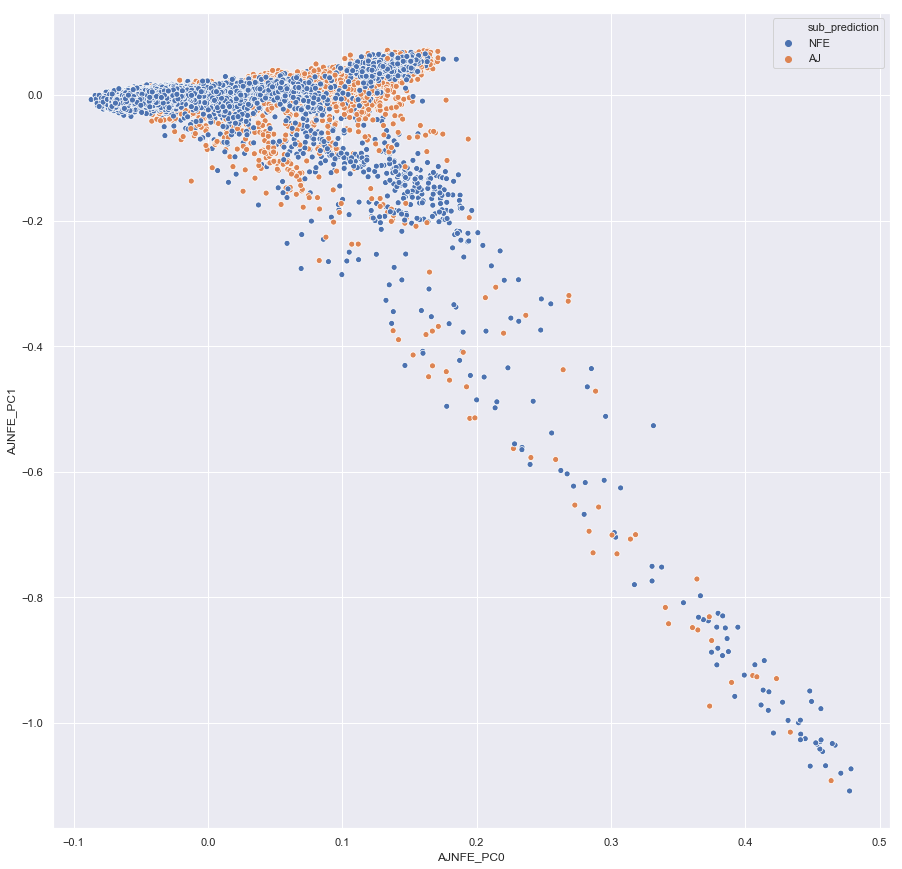

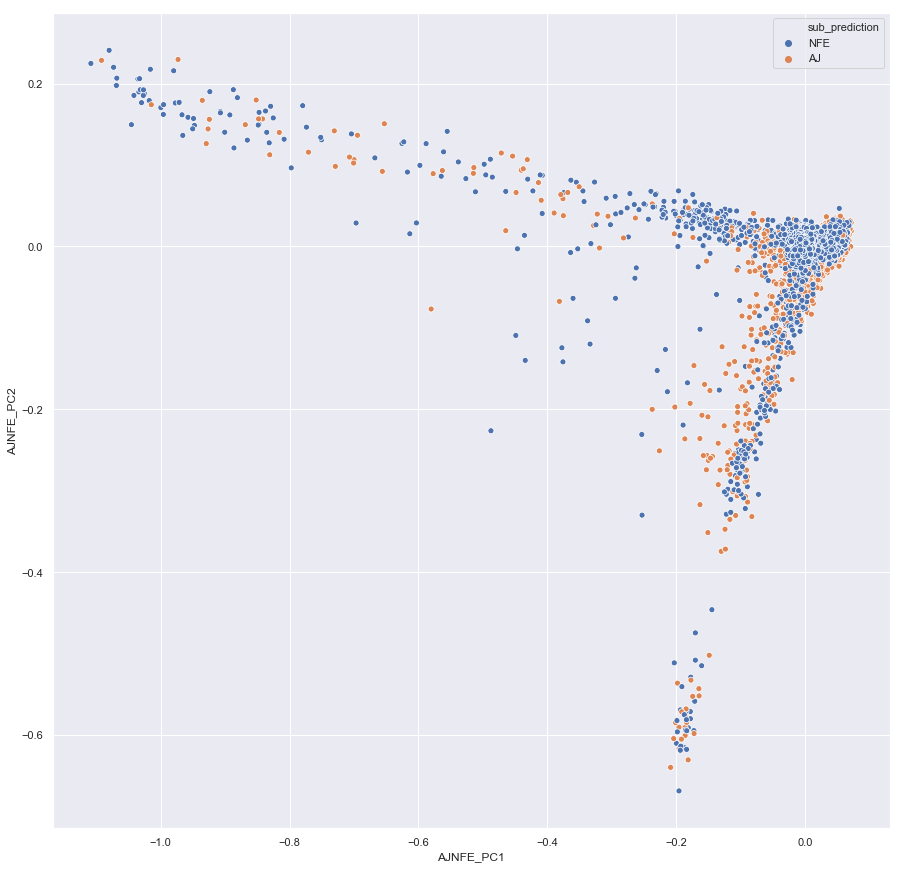

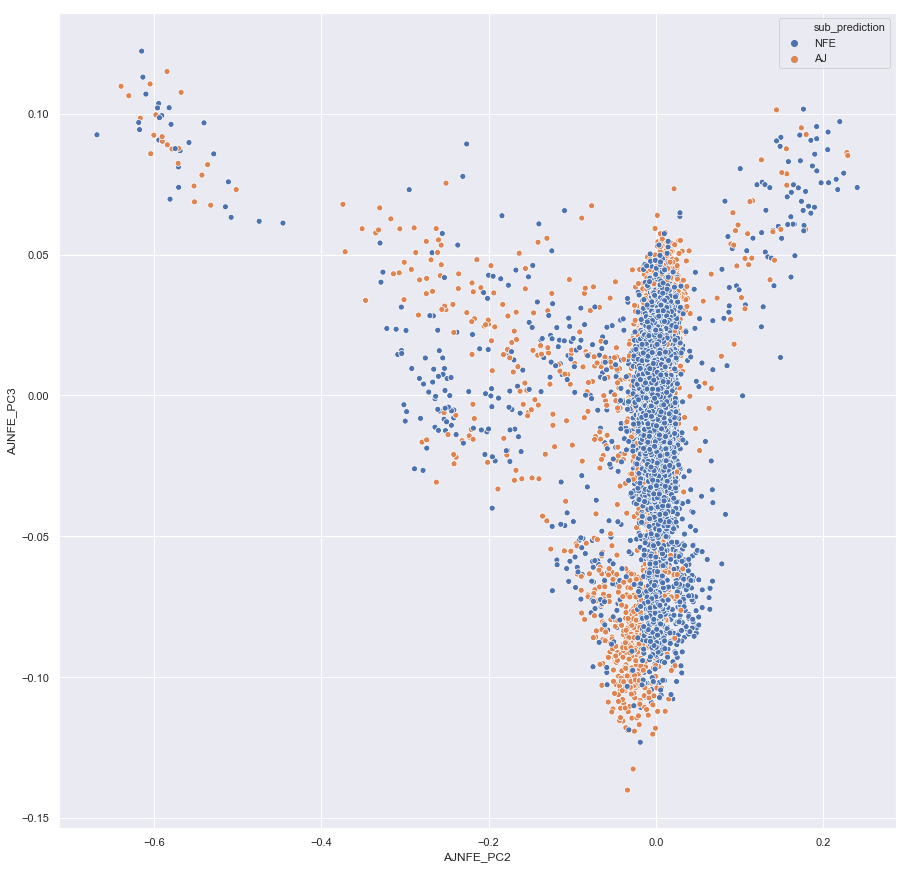

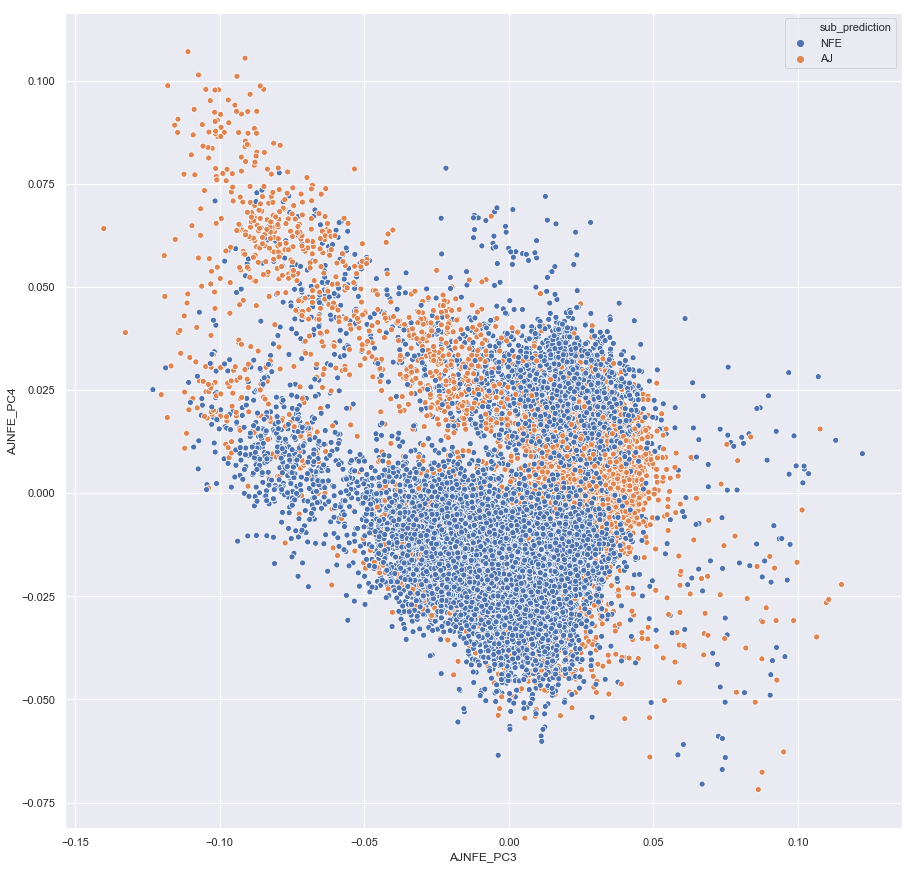

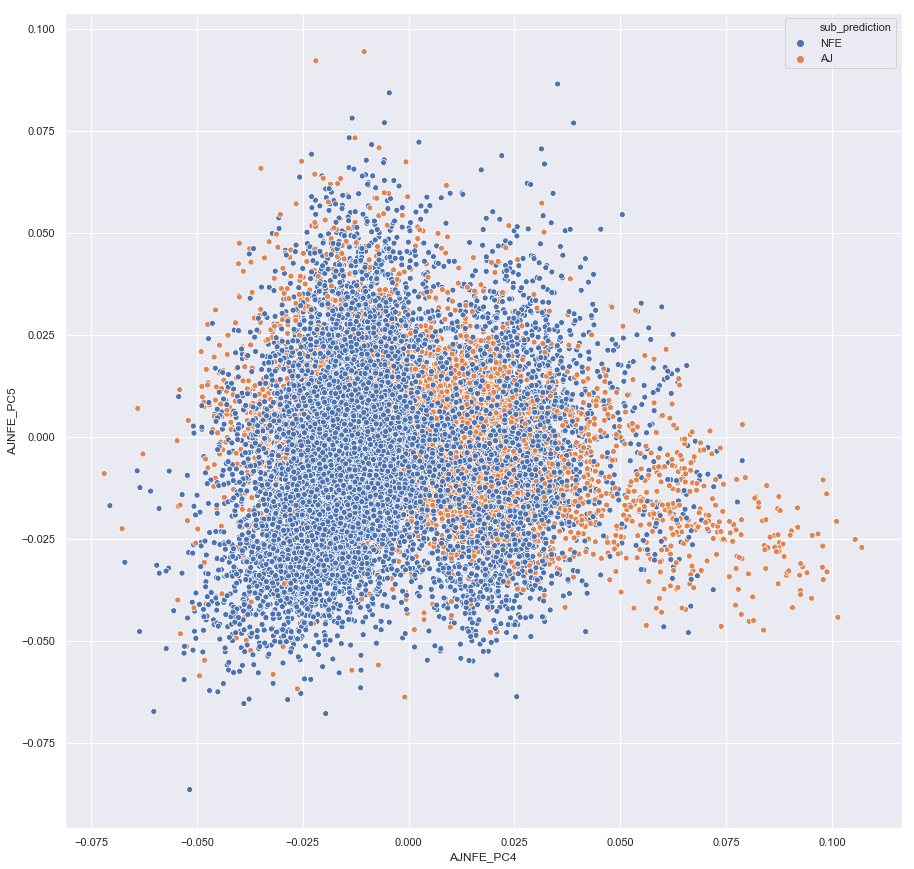

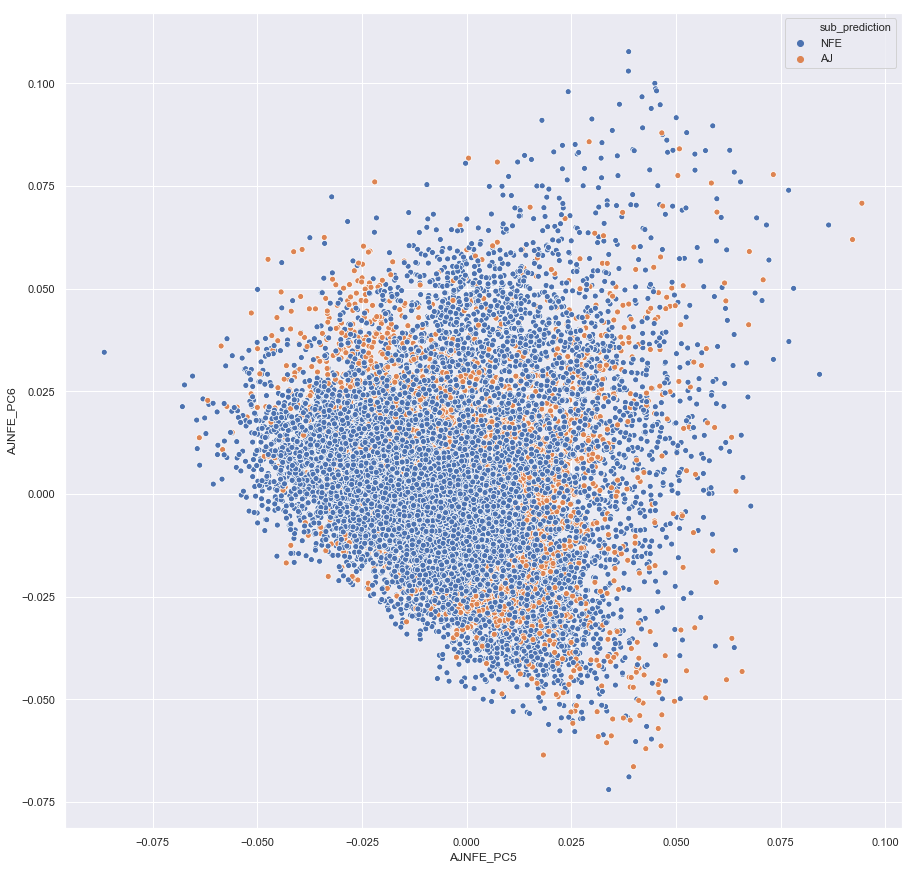

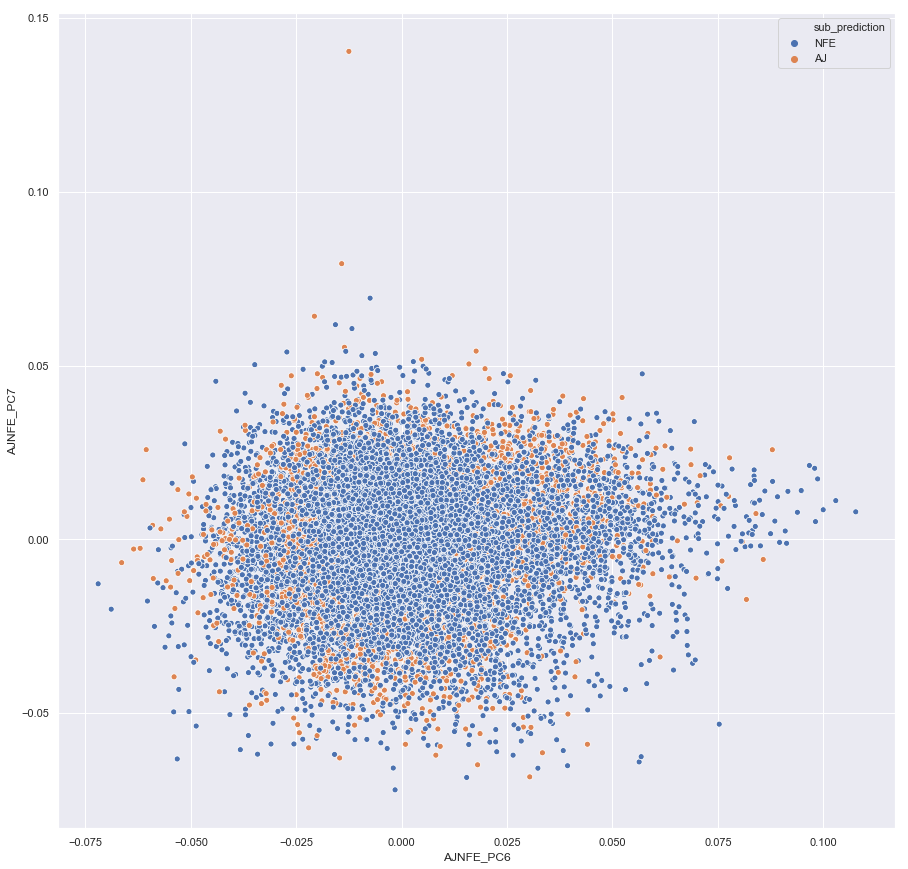

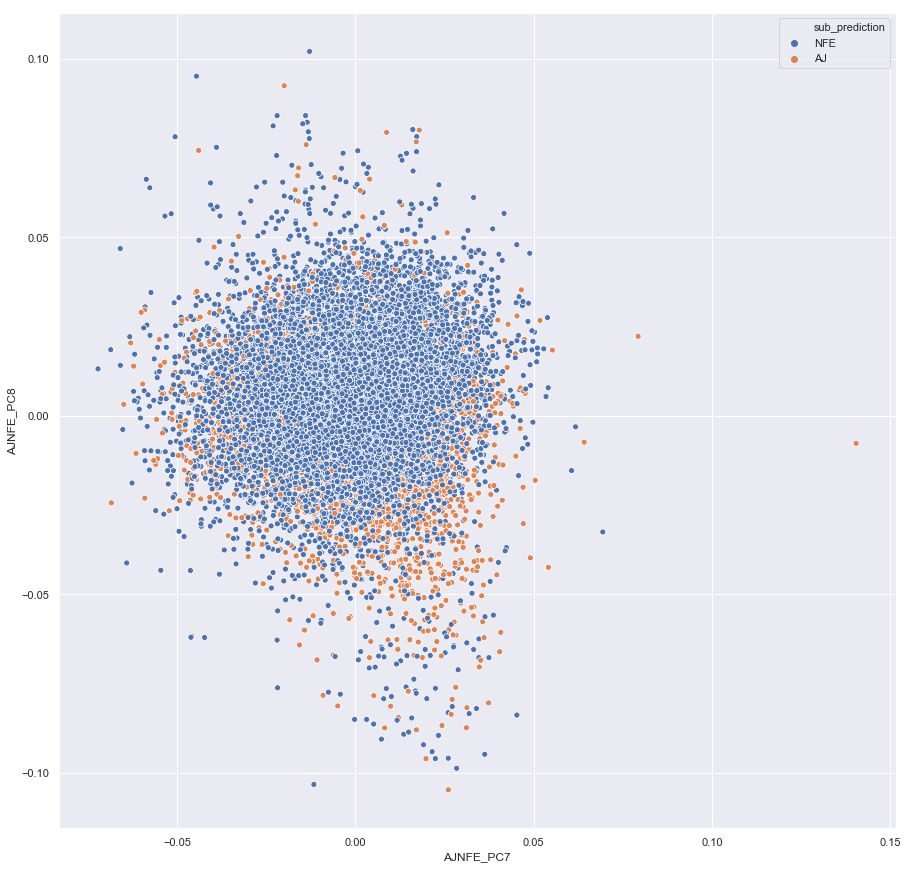

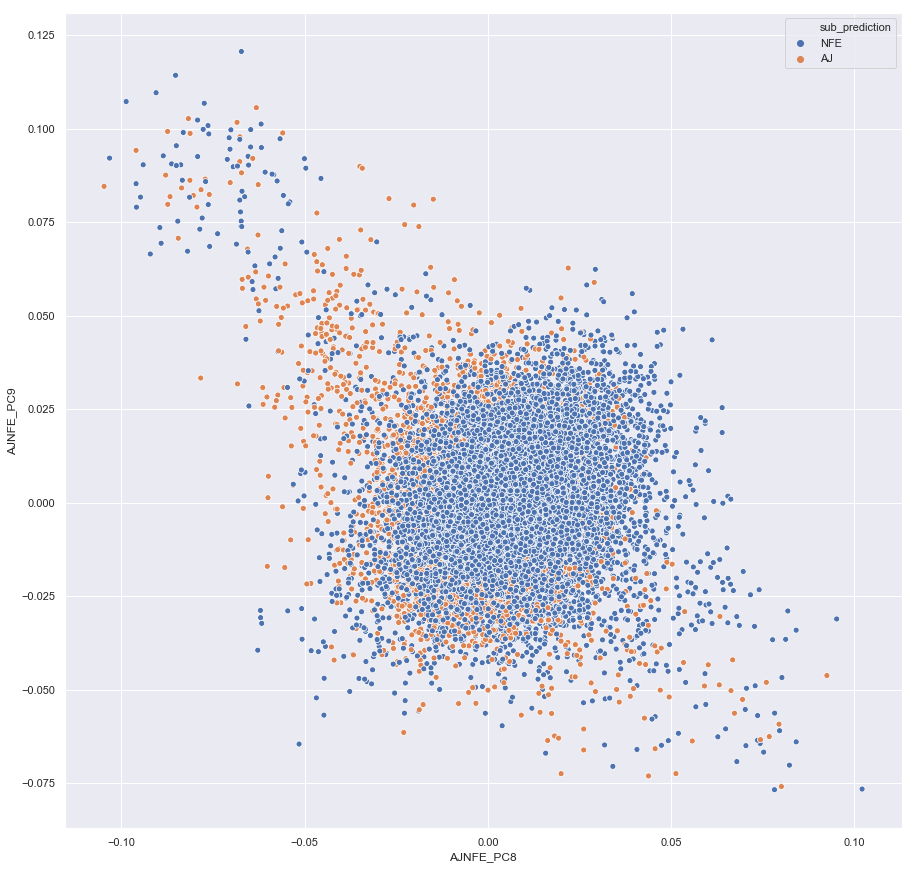

In [67]:
aj_nfe_cols = ['AJNFE_PC' + str(i) for i in range(10)]
for i in range(9):
    plt.figure(figsize=(15,15))
    sns.set()
    sns.scatterplot(aj_nfe_cols[i], aj_nfe_cols[i+1], hue='sub_prediction', data=aj_nfe_train_pc_data)#, #palette=dict(AFR="#ee4035", AMR="#f37736", EAS="#ffc425", EUR="#7bc043", NA="#0392cf", SAS="#9e379f")).set_title(name + ' Samples PCA with Predicted Superpopulation Labels')

Some samples erroneously were classified as South Asians across our datasets. If not explicitly from 1kG samples that are actually SAS, we assume that these samples were actually AMR samples that were misclassified.

In [ ]:
# #Replace all SAS with AMR BUT NOT THOSE IN KG
# for i, row in pc_data.iterrows():
#     if pc_data.at[i, 's'] not in kg_samples and pc_data.at[i, 'sub_prediction'] == 'SAS':
#         pc_data.at[i, 'sub_prediction'] = 'AMR'

In [ ]:
# # Drop unnecessary columns
# pc_data = pc_data.drop(['eur_prediction'], axis=1)
# if not os.path.exists('pc_data_sub_predictions_090619.tsv'):
#     print("Writing...")
#     pc_data.to_csv('pc_data_sub_predictions_090619.tsv', sep='\t', index=False)

And there we have it - finalized labels for all samples in our datasets. This was also frozen in the cell above. Enjoy the pretty picture.

In [ ]:
# #pc_data = pd.read_table('pc_data_sub_predictions_090619.tsv')
# plt.figure(figsize=(15,15))
# sns.set()
# sns.scatterplot('PC0', 'PC1', hue='sub_prediction', data=pc_data)#, #palette=dict(AFR="#ee4035", AMR="#f37736", EAS="#ffc425", EUR="#7bc043", NA="#0392cf", SAS="#9e379f")).set_title(name + ' Samples PCA with Predicted Superpopulation Labels')

The final step is to generate the lists needed to run future analyses - GWAS, local ancestry painting, etc.

- AJ, EAS, FIN, LIT, NFE, SAS  samples are written to file
- AMR, HISPANIC, and PUERTO RICAN samples are combined into one file (HIS) for future local ancestry painting
- AFR are also written to file for future local ancestry painting

In [ ]:
# pc_data.to_csv('pc_data_sub_predictions_091119.tsv', sep='\t', index=False)

In [ ]:
# for pop in ['AJ', 'EAS', 'FIN', 'LIT', 'NFE', 'SAS']:
#     df = pc_data[pc_data['sub_prediction'] == pop]
#     df[['s', 'COHORT', 'dataset', 'DIAGNOSIS']].to_csv('final_population_lists/' + pop + '_sample_list.tsv', sep='\t', index=False)

# pc_data[pc_data['sub_prediction'].isin(['AMR', 'HISPANIC', 'PUERTO RICAN'])][['s', 'COHORT', 'dataset', 'DIAGNOSIS']].to_csv('final_population_lists/HIS_sample_list.tsv', sep='\t', index=False)
# pc_data[pc_data['sub_prediction'] == 'AFR'][['s', 'COHORT', 'dataset', 'DIAGNOSIS']].to_csv('final_population_lists/AFR_sample_list.tsv', sep='\t', index=False)

In [ ]:
# pc_data.groupby('sub_prediction').count()['s']

In [ ]:
# #pc_data = pd.read_table('pc_data_sub_predictions_090619.tsv')
# # for pop in np.unique(pc_data['RACE/ETHNICITY']):
# #     fig, ax = plt.subplots(figsize=(15,15))
# #     sns.set()
# #     sns.scatterplot('EUR_PC0', 'EUR_PC1', hue='COHORT', data=pc_data[(pc_data['RACE/ETHNICITY'] == pop)], ax=ax)
# #     ax.set_title(pop)
# #     ax.set_ylim(-0.35, 0.35)
# #     ax.set_xlim(-0.25, 0.45)

# fig, ax = plt.subplots(figsize=(15,15))
# sns.set()
# sns.scatterplot('EUR_PC0', 'EUR_PC1', hue='RACE/ETHNICITY', data=pc_data[(pc_data['RACE/ETHNICITY'].isin(['AJ', 'NFE', 'FIN', 'LIT']))])# | (pc_data['RACE/ETHNICITY'] == 'NFE')], ax=ax)
# # fig, ax = plt.subplots(figsize=(15,15))
# # sns.set()
# # sns.scatterplot('EUR_PC0', 'EUR_PC1', hue='COHORT', data=pc_data[(pc_data['RACE/ETHNICITY'] == 'NFE')])# | (pc_data['RACE/ETHNICITY'] == 'NFE')], ax=ax)
# #UNLABEL outliers

# #, #palette=dict(AFR="#ee4035", AMR="#f37736", EAS="#ffc425", EUR="#7bc043", NA="#0392cf", SAS="#9e379f")).set_title(name + ' Samples PCA with Predicted Superpopulation Labels')